## Gradient Method

The key idea behind the gradient method is that for any differentiable function $C(\textbf{W}) \in \mathbb{R}^N\rightarrow\mathbb{R}$, its first derivative is equal to zero at local minimums/maximums. To find a local minimum $\textbf{W}_{minimum} \in \mathbb{R}^N$, we can iteratively move opposite to the direction of the first derivative until the derivative is equal to zero.

$$ \textbf{W}_{t+1} = \textbf{W}_{t} - \alpha \nabla_{\textbf{W}_{t}} $$

$$ \nabla_{\textbf{W}_t} = \frac{\partial C(\textbf{W}_t)}{\partial \textbf{W}_t} $$

Here, $\alpha \in \mathbb{R}$ is the learning rate, which determines the ratio between the magnitude of the derivative at $ \textbf{W}_{t}$ and the magnitude of the jump from $\textbf{W}_{t}$ to $\textbf{W}_{t+1}$.

### Example 1: Quadratic Function

Given function $\text{Q}(\textbf{X}) \in \mathbb{R}^N \rightarrow \mathbb{R}$ defined as:
$$ \text{Q}(\textbf{X}) = \sum_i^N {x_i^2} $$

And its first derivative $\nabla_{\textbf{X}}{\text{Q}(\textbf{X})} \in \mathbb{R}^N \rightarrow \mathbb{R}^N$ defined as:
$$ \nabla_{\textbf{X}}{\text{Q}(\textbf{X})} = 2\textbf{X} $$

Find $\textbf{X}_{minimum}$ such that $\text{Q}(\textbf{X})$ has the lowest possible value, 
$\textbf{X}_{minimum} = \text{argmin}_\textbf{X}\text{Q}(\textbf{X})$.

In [1]:
import numpy as np

def Q(X: np.array) -> float:
    return np.sum(X**2)

def dQ(X: np.array) -> np.array:
    return 2*X

In [2]:
X1 = np.array([50., 50.])
print(f'X1     = {X1}')
print(f'Q(X1)  = {Q(X1)}')
print(f'dQ(X1) = {dQ(X1)}')

X1     = [50. 50.]
Q(X1)  = 5000.0
dQ(X1) = [100. 100.]


In [3]:
from typing import Callable
import pandas as pd

def gradient_descent(
    start: np.array, 
    derivative: Callable[[np.array], np.array], 
    learning_rate: float, 
    iterations: int
    ):
    
    current = start
    X_current_history = []
    X_gradient_history = []
    
    for i in range(iterations):
        X_current_history.append(current)
        
        gradient = derivative(current)
        step = -learning_rate * gradient
        current = current + step
        
        X_gradient_history.append(gradient)

    X_current_history = np.array(X_current_history)
    X_gradient_history = np.array(X_gradient_history)
    
    history = pd.DataFrame({
        'x0': X_current_history[:, 0],
        'x1': X_current_history[:, 1],
        'dx0': X_gradient_history[:, 0],
        'dx1': X_gradient_history[:, 1],
    })

    return current, history

In [4]:
X_minimal, history = gradient_descent(X1, dQ, 0.1, 20)
print(f'X_minimal = {X_minimal}')
history

X_minimal = [0.57646075 0.57646075]


,x0,x1,dx0,dx1
0,50.000000,50.000000,100.000000,100.000000
1,40.000000,40.000000,80.000000,80.000000
2,32.000000,32.000000,64.000000,64.000000
3,25.600000,25.600000,51.200000,51.200000
4,20.480000,20.480000,40.960000,40.960000
5,16.384000,16.384000,32.768000,32.768000
6,13.107200,13.107200,26.214400,26.214400
7,10.485760,10.485760,20.971520,20.971520
8,8.388608,8.388608,16.777216,16.777216
9,6.710886,6.710886,13.421773,13.421773


In [5]:
from utils.garden import *
%config InlineBackend.figure_format ='retina'

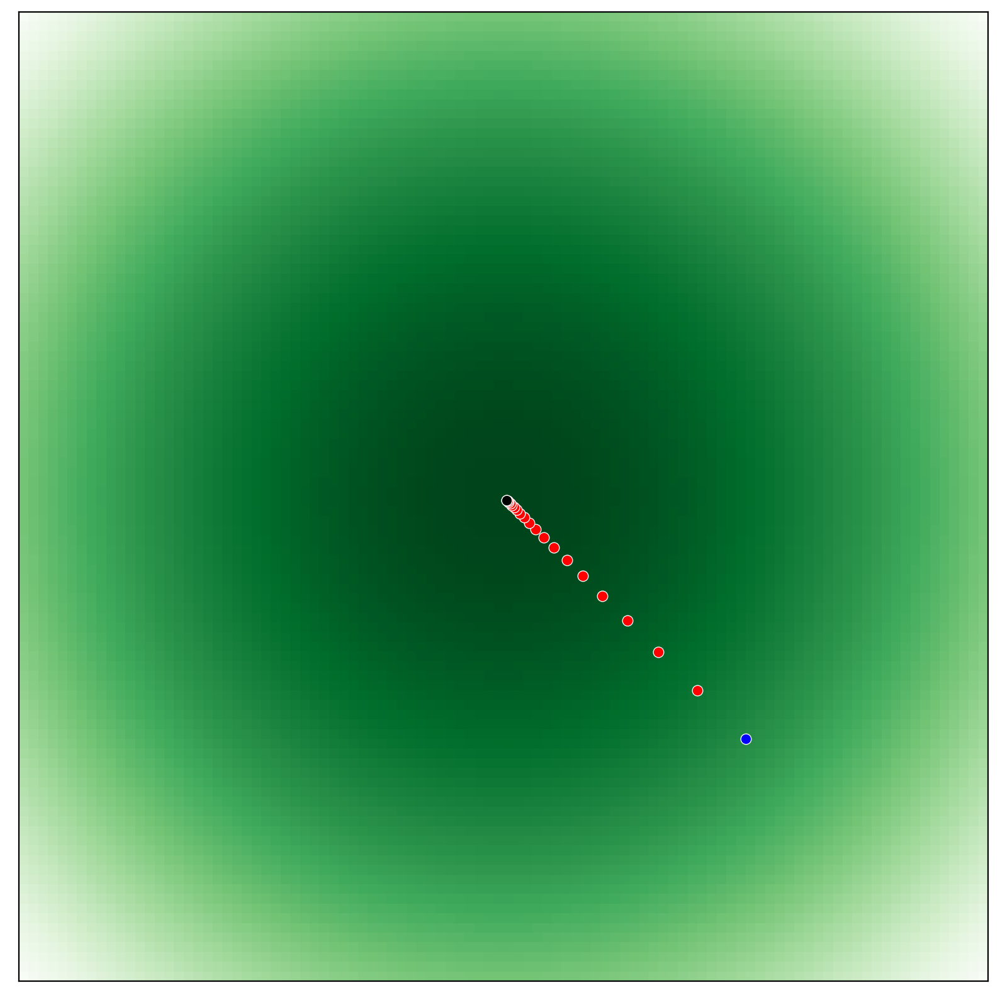

In [6]:
fig = plt.figure(figsize=[10, 10])

plot_field(
    fig=fig,
    field=evaluate_on_square(Q, location=(0,0), side=200),
    location=(0, 0),
    side=200
)

plot_learning_path(
    fig,
    [history.values], 
)

None

### Example 2: Finding gradients with backpropagation

Given a computation graph that evaluates $y$ from $x$, and a particular value $x = x_0$,
the backpropagation algorithm evaluates the value of $\nabla_{x} y(x)$ at point $x_0$.
This calculation is possible for any function using the chain rule.

In Calculus, the chain rule explains how to take derivatives of composite functions. For example, given two functions:

$
f(x) \in \mathbb{R} \rightarrow \mathbb{R} \\
g(x) \in \mathbb{R} \rightarrow \mathbb{R} 
$

What's the derivative of $f(g(x))$?

$$ z = g(x) $$
$$ \frac{\partial f(g(x))}{\partial x} = \frac{\partial f(z)}{\partial z} \frac{\partial g(x)}{\partial x} $$

In the multi-path case:
$$ \frac{\partial f(g_0(x), ..., g_n(x))}{\partial x} = \sum_i^n{\frac{\partial f}{\partial g_i}\frac{\partial g_i}{\partial x}}  $$

Backpropagation is an efficient way to evaluate the value of a function's derivative
at a particular point. Instead of analyzing the function symbolically, we can
calculate derivatives of its components and multiply them together.

In [7]:
import tensorflow as tf

def Qt(X: tf.Tensor) -> tf.Tensor:
    return tf.reduce_sum(X ** 2)

with tf.GradientTape() as tape:
    X2 = tf.Variable([50, 50], dtype='float')
    Y = Qt(X2)
    gradient = tape.gradient(Y, X2)

print(gradient)

tf.Tensor([99.99999 99.99999], shape=(2,), dtype=float32)


2022-09-18 22:51:49.900717: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-18 22:51:49.927584: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-18 22:51:49.927764: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-18 22:51:49.928260: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropri

### Example 2: Gradient Descent with Tensorflow

Given function $\text{S}(\textbf{x}) \in \mathbb{R}^2 \rightarrow \mathbb{R}$ defined as:
$$ \text{S}(\textbf{x}) = 3\text{sin}(x_0) + \text{sin}(x_1)^2 $$

Find $\textbf{x}_{minimum}$ such that $\text{S}(\textbf{x})$ has the lowest possible value, $\textbf{x}_{minimum} = \text{argmin}_\textbf{x}{\text{S}(\textbf{x})}$.

In [8]:
def S(X: tf.Tensor) -> tf.Tensor:
    factors = tf.constant([3., 1.], dtype='float64')
    powers = tf.constant([1., 1.], dtype='float64')
    
    z = (tf.math.sin(X) * factors) ** powers
    
    return tf.reduce_sum(z)

In [9]:
def tf_gradient_descent(
    optimizer: tf.compat.v1.train.Optimizer,
    loss_factory: Callable[[tf.Tensor], tf.Tensor],
    side: int, 
    iterations: int
    ):
    
    # Random location to start from
    X = 0.6 * side * (np.random.rand(2) - 1/2)
    X = tf.Variable(X, dtype=tf.float64)
    
    X_history = [tuple(X.numpy())]
    
    for _ in range(iterations):
        optimizer.minimize(loss=lambda: loss_factory(X), var_list=[X])
        X_history.append(tuple(X.numpy()))

    return np.array(X_history)

def simulate_garden(
    optimizer: tf.compat.v1.train.Optimizer,
    loss_factory: Callable[[tf.Tensor], tf.Tensor] = S,
    experiments: int = 20,
    side: int = 30,
    iterations: int = 40,
    seed: int = 42
    ) -> np.array:
    
    np.random.seed(seed)
    return np.array([
        tf_gradient_descent(
            optimizer, 
            loss_factory, 
            side=side, 
            iterations=iterations
        ) 
        for _ in range(experiments)
    ])

In [10]:
%%time
paths = simulate_garden(tf.keras.optimizers.SGD(learning_rate=0.1), experiments=20)
animate_garden(S, paths)

CPU times: user 4.46 s, sys: 293 ms, total: 4.76 s
Wall time: 3.48 s


In [11]:
?tf.keras.optimizers.SGD

Init signature:
tf.keras.optimizers.SGD(
    learning_rate=0.01,
    momentum=0.0,
    nesterov=False,
    name='SGD',
    **kwargs,
)
Docstring:     
Gradient descent (with momentum) optimizer.

Update rule for parameter `w` with gradient `g` when `momentum` is 0:

```python
w = w - learning_rate * g
```

Update rule when `momentum` is larger than 0:

```python
velocity = momentum * velocity - learning_rate * g
w = w + velocity
```

When `nesterov=True`, this rule becomes:

```python
velocity = momentum * velocity - learning_rate * g
w = w + momentum * velocity - learning_rate * g
```

Args:
  learning_rate: A `Tensor`, floating point value, or a schedule that is a
    `tf.keras.optimizers.schedules.LearningRateSchedule`, or a callable
    that takes no arguments and returns the actual value to use. The
    learning rate. Defaults to 0.01.
  momentum: float hyperparameter >= 0 that accelerates gradient descent
    in the relevant
    direction and dampens oscillations. Defaults to 0, 

### Mini-Batch Gradient Descent

If X = # of observations (batch gradient descent), the cost should be decreasing on every iteration. If it's not the learning rate is probably too big. This might be computationally inefficient, since the gradient might be well estimated on a subset of all observations.

If X = 1 (stochastic gradient descent), the cost might or might not decrease on every iteration. The learning curve will be very noisy. This is computationally inefficient, because the cost is not calculated with vectorized optimizations.

If N > X > 1 (mini-batch gradient descent), the cost might or might not decrease on every iteration. The learning curve will be somewhat noisy. With a well-optimized X, the computitional efficiency will be optimal.

## Momentum

$$
\begin{align}
    \textbf{V}_{t+1} & = \beta \textbf{V}_t + (1 - \beta) \nabla_{\textbf{W}_t} \\
    \textbf{W}_{t+1} & = \textbf{W}_t - \alpha \textbf{V}_{t+1}
\end{align}
$$

Intuitively, this combines the previous-iteration velocity and current-iteration acceleration of the learning process. Usually, $\beta$ is about 0.9, but should be optimized with other hyperparameters.

### Example 3: Momentum with Tensorflow

In [12]:
%%time
paths = simulate_garden(tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.3))
animate_garden(S, paths)

CPU times: user 1.13 s, sys: 23.5 ms, total: 1.15 s
Wall time: 1.05 s


Note that Keras SGD optimizer supports Momentum as a hyperparameter.

## Root Mean Square (RMSprop)

$$ 
\begin{align}
    \textbf{S}_{t+1} & = \gamma \textbf{S}_{t} + (1-\gamma) (\nabla_{\textbf{W}_t})^2 \\
    \textbf{W}_{t+1} & = \textbf{W}_{t} - \alpha \frac{\nabla_{\textbf{W}_t}}{\sqrt{\textbf{S}_{t+1}}} 
\end{align}
$$

The factor $\sqrt{\textbf{S}_{t+1}}$ is small when gradient is small, so we move faster in that direction. When the gradient is large, we move slower in that direction. This helps to avoid overshooting the minimum and getting stuck in the plateaus. 

In particular, learning rate $\alpha$ can be pretty big, but the adjusted factor will prevent oscillations.

In [13]:
%%time
paths = simulate_garden(tf.keras.optimizers.RMSprop(learning_rate=0.1))
animate_garden(S, paths)

CPU times: user 1.51 s, sys: 29.2 ms, total: 1.54 s
Wall time: 1.43 s


In [14]:
?tf.keras.optimizers.RMSprop

Init signature:
tf.keras.optimizers.RMSprop(
    learning_rate=0.001,
    rho=0.9,
    momentum=0.0,
    epsilon=1e-07,
    centered=False,
    name='RMSprop',
    **kwargs,
)
Docstring:     
Optimizer that implements the RMSprop algorithm.

The gist of RMSprop is to:

- Maintain a moving (discounted) average of the square of gradients
- Divide the gradient by the root of this average

This implementation of RMSprop uses plain momentum, not Nesterov momentum.

The centered version additionally maintains a moving average of the
gradients, and uses that average to estimate the variance.

Args:
  learning_rate: A `Tensor`, floating point value, or a schedule that is a
    `tf.keras.optimizers.schedules.LearningRateSchedule`, or a callable
    that takes no arguments and returns the actual value to use. The
    learning rate. Defaults to 0.001.
  rho: Discounting factor for the history/coming gradient. Defaults to 0.9.
  momentum: A scalar or a scalar `Tensor`. Defaults to 0.0.
  epsilon: 

## Adaptive Moment Estimation (Adam)

Momentum estimates the first moment, RMSprop estimates the second moment of the gradient. When combined, we get the adaptive moment estimation. Additionally, we need bias correction due to $\textbf{V}$ and $\textbf{S}$ initialized to zero:

$$
\begin{align}
    \textbf{V}_{t+1} & = \beta \textbf{V}_{t} + (1 - \beta) \nabla_{\textbf{W}_t} \\
    \textbf{S}_{t+1} & = \gamma \textbf{S}_{t} + (1 - \gamma) (\nabla_{\textbf{W}_t})^2 \\
    \tilde{\textbf{V}}_{t+1} & = \frac {\textbf{V}_{t+1}} {(1-\beta^t)} \\
    \tilde{\textbf{S}}_{t+1}&  = \frac {\textbf{S}_{t+1}} {(1-\gamma^t)} \\
    \textbf{W}_{t+1} & = \textbf{W}_{t} - \alpha \frac {\tilde{\textbf{V}}_{t+1}} {\sqrt{\tilde{\textbf{S}}_{t+1}}}
\end{align}
$$

Typically $\beta = 0.9$ and $\gamma = 0.999$

In [15]:
%%time
paths = simulate_garden(tf.keras.optimizers.Adam(learning_rate=0.1))
animate_garden(S, paths)

CPU times: user 1.45 s, sys: 16 ms, total: 1.46 s
Wall time: 1.35 s


In [16]:
?tf.keras.optimizers.Adam

Init signature:
tf.keras.optimizers.Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    amsgrad=False,
    name='Adam',
    **kwargs,
)
Docstring:     
Optimizer that implements the Adam algorithm.

Adam optimization is a stochastic gradient descent method that is based on
adaptive estimation of first-order and second-order moments.

According to
[Kingma et al., 2014](http://arxiv.org/abs/1412.6980),
the method is "*computationally
efficient, has little memory requirement, invariant to diagonal rescaling of
gradients, and is well suited for problems that are large in terms of
data/parameters*".

Args:
  learning_rate: A `Tensor`, floating point value, or a schedule that is a
    `tf.keras.optimizers.schedules.LearningRateSchedule`, or a callable
    that takes no arguments and returns the actual value to use, The
    learning rate. Defaults to 0.001.
  beta_1: A float value or a constant float tensor, or a callable
    that takes no arguments and ret